<h1>Simulation of the VLA Radio Interferometer</h1>
Steven Charles-Mindoza

# Introduction
***
<p style='text-align: justify;'>
 The VLA hosts 27 antennas, with each one comprising of a 25 meter dish housing 8 receivers with a weight of 209 metric tonnes. The dishes move across three arms of a track, on an altitude-azimuth mount, in the shape of a Y configuration. Using the specially designed lifting train (Heins Train), the array can extend and contract to four different configurations throughout the course of 16 months, allowing aperture synthesis interferometry of up to 351 baselines.  At its maximum, the extension is akin to the optical zoom on a camera, able to resolve detail across further distance. In this configuration, the VLA lengthens each of its legs from two-thirds of a mile to 23 miles long. Configuration A is the largest, and for this project we will be working with the smallest of the list, configuration D.

# Definitions
***
<p style='text-align: justify;'>The first step is to import the data for the EVLA in D-Config. The x and y coordinates are cycled through to find all unique basline pairs possible. In this case, the VLA has 27 stations which corresponds directly to 351 baselines. The general formula for this relationship is $\frac{1}{2}N(N-1)$.
<br><br>
<b>Baseline Visibility:</b> $V(X,Y)$
    <br>
The baseline station coordinates $V(X,Y)$ are given by the unique differences, where $xyz$ in the following represents the difference in x, y and z respectively.
    <br><br>
\begin{equation}
V\left(X,Y\right)_{m,n} \forall m>n = 
\begin{pmatrix}
0 & 0 & 0 & 0  \\
xyz_{2,1} & 0 & 0 & 0 \\
xyz_{3,1}  & xyz_{3,2}  & 0 & 0  \\
xyz_{m,1} & xyz_{m,2} & xyz_{m,3} & 0
\end{pmatrix}
\end{equation}
    <br>
$V(X,Y)$ then represents a $351x3$ array containing unique cyclic pairs of the baseline coordinate differences (X, Y and Z) derived from the differences of the antenna coordinates x, y and z. 
<br><br>
<b>UV Visibility:</b> $V(X,Y)\xrightarrow{}V(u,v)$
    <br>
The transformation to uv coordinates $V(u,v)$ is given by
    <br><br>
\begin{equation}
\begin{pmatrix}
u\\
v\\
w
\end{pmatrix}
=
\frac{1}{\lambda}
\begin{pmatrix}
\sin H & \cos H & 0\\ 
-\sin \delta \cos H & \sin\delta\sin H & \cos\delta\\
\cos \delta \cos H & -\cos\delta\sin H & \sin\delta\\
\end{pmatrix} 
\begin{pmatrix}
X\\
Y\\
Z
\end{pmatrix}.
\end{equation}
    <br>
    <b>Sampled Grid:</b> $S(u,v) \xrightarrow{\mathcal{F}} s(l,m)$
    <br>
Plotting the <i>UV Visibilities</i> over the <i>hour angle</i> $H$ will give the <i>UV Coverage</i> $V(u,v)$ over the course of earths rotation. To create the <i>Dirty Beam</i> $s(l,m)$ we then need to map this function to a <i>Sampled Grid</i>, $S(u,v)$. This is achieved via a Fourier transform. The completely filled in visibility plane is obtained via

\begin{equation}
S(u,v) \xrightarrow{\mathcal{F}} s(l,m) = \mathcal{F}\left(\sum_k A_k \delta(l-l_k,m-m_k)\right) = \sum_k A_k e^{-2\pi i (ul_i+vm_i)}.
\end{equation}
<br>
    <b>True Image:</b> $T(l,m)$
    <br>
The 2D Fourier transform, where $T(l,m)$ is the <i>True Image</i>, is

\begin{equation}
T(l,m) = \int_{-\infty}^{\infty} \int_{-\infty}^{\infty} V(u,v) e^{2\pi i(ul+vm)} \,du\,dv.
\end{equation}

With Euler's formula $e^{ix} = \cos x + i \sin x$ we can expand this to, in discrete form

\begin{equation}
T(l,m) = \sum_{u=-\infty}^{\infty} \sum_{v=-\infty}^{\infty} V(u,v) (\cos(2\pi(ul+vm)) + i\sin(2\pi(ul+vm))) \,\Delta u\,\Delta v,
\end{equation}

and conversely the visibilities can be described as the sine/cosine decomposition of the image

\begin{equation}
V(u,v) = \sum_{l=-1}^{1} \sum_{m=-1}^{1} T(l,m) (\cos(2\pi(ul+vm)) -  i\sin(2\pi(ul+vm))) \,\Delta l\,\Delta m.
\end{equation}
    <br>
    <b>Convolution Theorem:</b> $s(l,m)*T(l,m) = T^{D}(l,m)$<br>

The <i>Dirty Beam</i> $s(l,m)$ is then convoluted with the <i>True Image</i> $T(l,m)$ to create the <i>Dirty Image</i> $T^{D}(l,m)$
<br><br>
    <b>Primary Beam Width</b>
    <br>
The main beam <i>full-width at half maximum</i> (FWHM) beam width $\theta_{PB}$ defines the region on the sky over which the bandwidth smearing occurs. We define the <i>Aperture Efficiency</i> as $\eta \simeq\tfrac{1}{\sqrt{\ln{2}}}$, where the <i>Primary Beam</i> becomes
    <br><br>
    \begin{equation}
    \theta_{PB} = \frac{(180\times 3600)}{\pi}\frac{\eta\lambda}{D} \text{arcsec}.
    \end{equation}
    <br>
    <b>Synthesized Beam Width</b>
    <br>
    The <i>Synthesized Beam</i> can be described in terms of the maximum baseline of the observation.
     \begin{equation}
    \theta_{SB} \simeq \frac{(180\times 3600)}{\pi}\frac{\eta\lambda}{B_{max}} \text{arcsec}
    \end{equation}
     <br>
    <b>Fringe Period</b>
    <br>
    For a source at beam half power, $\theta = \tfrac{\lambda}{D}$.  At that radius 
     \begin{equation}
    t = \frac{D}{B_{max}\omega_{E}}
    \end{equation}
    where $\omega_{E} = 7.5\times 10^{-5}$rads$^{-1}$.
</p>

|Variable      |        Name                                                |
| ---          | :-                                                         |
  |$\eta$         |       Illumination Taper Factor (Aperture Efficiency)                              |
 |$B_{max}$            |    Maximum Baseline Difference                            | 
  |$D$            |    Antenna Diameter                            |   
   |$\lambda$            |    Observation Wavelength                            |   
  |$\omega_{E}$            |   Source Rotation Rate in the Sky                            |   

# Global Variables and Functions
***

In [317]:
import os
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format ='retina'
import seaborn as sns; #sns.set()
sns.set_style("darkgrid", {'axes.grid' : False})
from matplotlib import pyplot as plt
from scipy import signal
#============================================================================#
                     # Global Variables and Functions #
#============================================================================#
os.makedirs('plots', exist_ok = True) 
plt.rcParams['figure.dpi'] = 100
plt.rcParams.update({'font.size': 12})    
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
# Variable
f = 5e9                                                       # Frequency 5GHz
HA = 1                                                            # Hour Angle
DEC = np.radians(45)                                   # Declination of source
noise = 0                                            # Noise of uv Sample Grid
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
# Fixed   
c = 3e8                                                       # Speed of light
lam = c/f                                                         # Wavelength
steps = HA*120                                      # Samples every 30 seconds
H = np.linspace(-0.5*HA, 0.5*HA, steps)*(np.pi/12)      # Celestial Hour Angle
D = 25                                         # Diameter of Antenna in meters
taper_factor = (np.sqrt(np.log(2)))**(-1)          # Illumination Taper Factor
prim_beam_width = ((180*3600)/np.pi)*(taper_factor*lam/D) # Primary Beam Width
pixels = int(prim_beam_width*1.685)                    # Pixel count for image
rescale = int(0.337*prim_beam_width)                  # Pixel rescale for grid
#~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
# Gaussian Kernel
def gkern(n, std = 1, norm = False):
    '''
    Generates a n x n matrix with a centered gaussian 
    of standard deviation std centered on it. If normalised,
    its volume equals 1.'''
    gaussian1D = signal.gaussian(n, std)
    gaussian2D = np.outer(gaussian1D, gaussian1D)
    if norm:
        gaussian2D /= (2*np.pi*(std**2))
    return gaussian2D

def point_sources(file):
    ''' Point source data read in following format:
    --------------------------------------------------------------
        Right Ascension | Declination | Flux | Flux Labels
    --------------------------------------------------------------
    '''
    data_ps = np.loadtxt(file, dtype = float, usecols = (0,1,2))
    RA_ps, DEC_ps, flux_ps = data_ps[:,0]*(np.pi/12), \
                             data_ps[:,1]*(np.pi/180), data_ps[:,2]
    RA_diff = RA_ps - RA_ps[0]
    # Conversion into T(l,m)
    l = np.cos(DEC_ps)*np.sin(RA_diff)
    m = (np.sin(DEC_ps)*np.cos(DEC_ps[0]) - 
         np.cos(DEC_ps)*np.sin(DEC_ps[0])*np.cos(RA_diff))
    ''' Point source data output in following format:
    --------------------------------------------------------------
                            Flux | l | m 
    --------------------------------------------------------------
    '''
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Point sources
    ps = np.zeros((len(data_ps), 3))
    ps[:,0] = flux_ps
    # l, m in degrees
    ps[:,1] = l[0:]*(180/np.pi)
    ps[:,2] = m[0:]*(180/np.pi)
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Visibility tracks
    u_vis, v_vis = np.zeros((steps, len(DEC_ps))), \
                                   np.zeros((steps, len(DEC_ps)))
    for i in range(len(DEC_ps)):
        u_vis[:, i] = lam**(-1)*np.cos(H)
        v_vis[:, i] = lam**(-1)*np.sin(H)*np.sin(DEC_ps[i])

    return l, m, u_vis, v_vis

In [314]:
#============================================================================#
                            # Mathsy Stuff #
#============================================================================#
# For loading EVLA in D-Config
def import_file_VLA(file):
    '''
    Import data, first column as str, others as float
    File must be of the following format:
    --------------------------------------------------------------
        station    |    L_x    |    L_y    |    L_z    |    R    |
    --------------------------------------------------------------
    import_file handles all the importing of data, and performing math
    operations to pass to plotting functions.
    '''
    name = np.loadtxt(file, dtype = str, usecols = 0, skiprows = 1) # Stations
    xyz = np.loadtxt(file, usecols = (1,2,3), skiprows = 1)        # Positions
    l, m, u_vis, v_vis = point_sources('data/point_sources.txt')
    b = int(0.5*(len(xyz)*(len(xyz) - 1)))               # Number of baselines
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Difference between station arrays - 351 baselines for EVLA: 27 stations
    XYZ = []                       # X, Y, Z Coordinate differences of x, y, z
    for i, xyz_1 in enumerate(xyz):
        for j, xyz_2 in enumerate(xyz):
            if i < j:
                XYZ.append(xyz_1 - xyz_2)          # Differences in x, y and z
    XYZ = np.array(XYZ)
    b_max = np.amax(XYZ[:,0:1]) - np.abs(np.amin(XYZ[:,0:1]))
    fringe_sep = lam/b_max
    synth_beam_width = ((180*3600)/np.pi)*(taper_factor*lam/b_max)
    fringe_period = (7.3e-5)**(-1)*D/b_max
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Transform to UV coordinates: V(u,v), cycle across hour angle
    X, Y, Z = XYZ[:,0], XYZ[:,1], XYZ[:,2]
    u, v, w = np.zeros((b, steps)), np.zeros((b, steps)), np.zeros((b, steps))
    for i in range(b):
        u[i, :] = lam**(-1)*(np.sin(H)*X[i] + np.cos(H)*Y[i])
        v[i, :] = lam**(-1)*(-np.sin(DEC)*np.cos(H)*X[i] + 
                              np.sin(DEC)*np.sin(H)*Y[i] + 
                                            np.cos(DEC)*Z[i])
        # w[i, :] = lam**(-1)*(np.cos(DEC)*np.cos(H)*X[i] -           # Unused
        #                      np.cos(DEC)*np.sin(H)*Y[i] + 
        #                                     np.sin(DEC)*Z[i])
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Create the dimensions of the observed visibility plane
    u_vismax, v_vismax = np.amax(np.abs(u_vis)), np.amax(np.abs(v_vis))
    u_visgrid = np.linspace(-u_vismax, u_vismax, steps)
    v_visgrid = np.linspace(-v_vismax, v_vismax, steps) 
    U, V = np.meshgrid(u_visgrid, v_visgrid)
    obs = np.zeros(U.shape).astype(complex)                       
    # Cycle through point source values to create True Image: T(l,m)
    for i in ps:
        F, l, m = i
        obs += F*np.exp(2*np.pi*1j*(U*l + V*m))
        obs += F*np.exp(2*np.pi*1j*(u_vis[:, 0]*l + v_vis[:, 0]*m))
        obs += F*np.exp(2*np.pi*1j*(u_vis[:, 1]*l + v_vis[:, 1]*m))
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Create the dimensions of the full visibility plane
    u_max, v_max = np.amax(np.abs(u)), np.amax(np.abs(v))
    ugrid = np.linspace(-u_max, u_max, pixels)
    vgrid = np.linspace(-v_max, v_max, pixels) 
    uu, vv = np.meshgrid(ugrid, vgrid)
    image = np.zeros(uu.shape).astype(complex)                       
    # Cycle through point source values to create True Image: T(l,m)
    for i in ps:
        F, l, m = i
        image += F*np.exp(2*np.pi*1j*(uu*l + vv*m))        # True Image T(l,m)
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Create the sample grid: S(u,v), Creates Dirty Beam when fft: s(l,m)
    uv_grid = np.random.normal(0, noise, (pixels, pixels))#.astype(complex)
    # Sample the Visibility grid: V(u,v)*S(u,v)
    for i in range(steps):
        try:
            uv_grid[(v[:,i]/rescale).astype(np.int), 
                                       (u[:,i]/rescale).astype(np.int)] = 1
            uv_grid[(-v[:,i]/rescale).astype(np.int), 
                                      (-u[:,i]/rescale).astype(np.int)] = 1
        except Exception:
            # If uv sample is > pixels, skip.
            pass
    # FFT the sampled visibilty grid: fft{V(u,v)*S(u,v)} = s(l,m)
    dirty_beam = np.abs(np.fft.fftshift(np.fft.fft2(uv_grid)))   
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # True Image Convolved with Sampled Grid = Dirty Image
                                                    # s(l,m)*T(l,m) = T^D(l,m)
    dirty_image = np.abs(np.fft.fftshift(np.fft.ifft2(dirty_beam*image)))
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Orient images on the sky correctly
    image = np.rot90(image,3)                              # True Image T(l,m)    
    dirty_beam = np.rot90(dirty_beam,3)                    # Dirty Beam s(l,m)
    uv_grid = np.rot90(uv_grid,3)                      # Sample UV Grid S(u,v)
    dirty_image = np.rot90(dirty_image,3)               # Dirty Image T^D(l,m)
    return name, xyz, b_max, XYZ, synth_beam_width, fringe_sep, obs, \
             fringe_period, u, v, image, uv_grid, dirty_beam, dirty_image

|Variable      |        Name                                                |
| ---          | :-                                                         |
  |$xyz$         |       Station Coordinates                              |
 |$XYZ$            |    Baseline Coordinate Differences: $V(X,Y)$                            |
 |        $uvw$          |    UV Coordinates $V(u,v)$                               |
|$DEC$            |        Declination                                          |
|$H$          |        Hour Angle Sample Array                              |        |
| $T$            |        True Image: $T(u,v)$                                |       
|$S$            |        Sample Grid: $S(u,v)$                               |        
|$s$            |        Fourier Transformed Sample Grid: $s(l,m)$           |     
|$sT$           |        True Image Convolved with Sample Grid: $T^{D}(l,m)$ |         

# Checkpoints
***
- [x] A diagram to illustrate the configuration of your array.
- [x] A diagram to show your UV coverage.
- [ ] A diagram to show the real and imaginary components of your “observed” data.
- [x] A map of your field-of-view.
- [ ] Measured positions and flux densities of the sources in your field-of-view.
- [x] A map of your primary beam and a measurement of its dimensions.
- [x] A map of your synthesized beam and a measurement of its dimensions.

Checkpoint 3: The Fringe Period is 327.8188090368893 seconds.
Checkpoint 5: Origin point source signal is unnaffected by a reduction in peak response.
Checkpoint 5: Offset point source reduction in peak response from the primary beam is: 0.8186483660039867
Checkpoint 6: The Primary Beam-Width is 594.5982742257186 arcsec.
Checkpoint 7: The Synthesized Beam-Width is 14.22919636218073 arcsec.


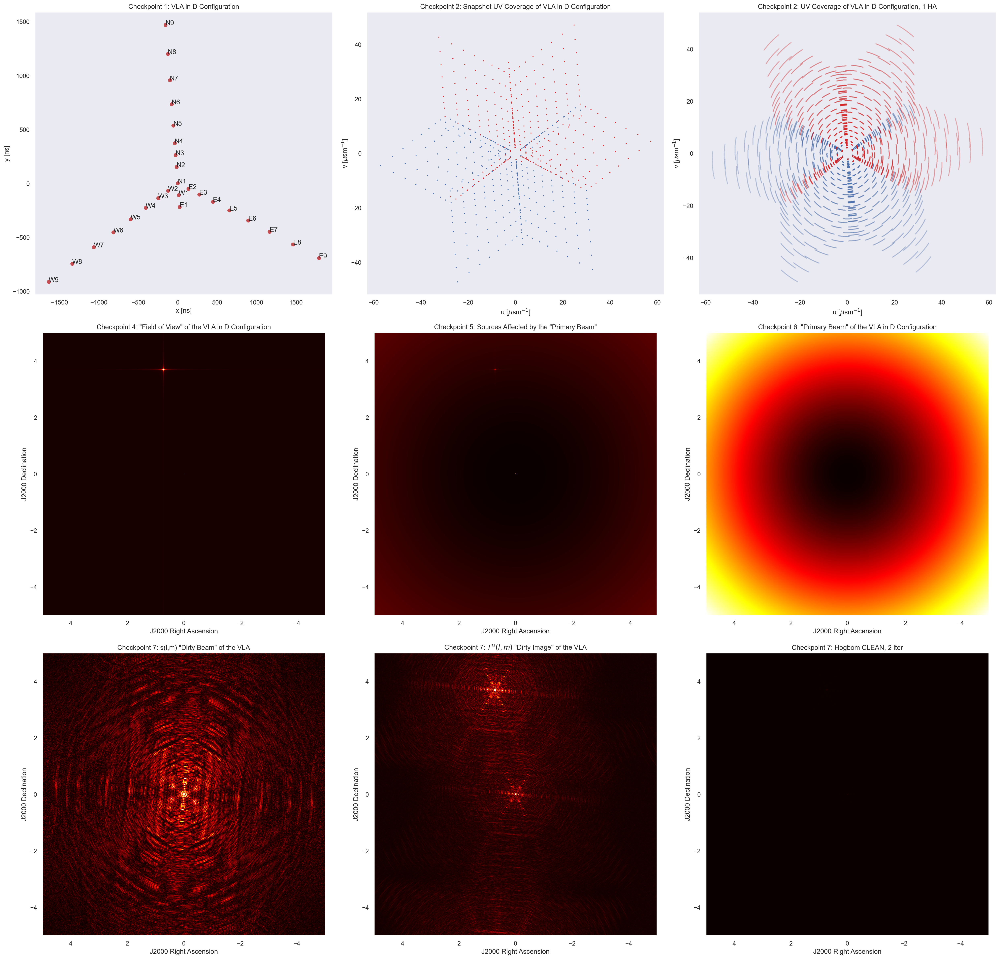

In [319]:
def main(file):
    name, xyz, b_max, XYZ, synth_beam_width, fringe_sep, obs, fringe_period, \
    u, v, image, uv_grid, dirty_beam, dirty_image = import_file_VLA(file)
    #========================================================================#
                                # Checkpoint 1 #
    #========================================================================#
    # Plot the station locations
    fig, ax = plt.subplots(figsize = (25, 24))
    plt.subplot(331)
    plt.plot(xyz[:,1], xyz[:,2], 'or')
    plt.xlabel('x [ns]')
    plt.ylabel('y [ns]')
    plt.title('Checkpoint 1: VLA in D Configuration')
    for i, txt in enumerate(name):            # Add station names to locations
        plt.annotate(txt, (xyz[:,1][i], xyz[:,2][i]))
    #========================================================================#
                                 # Checkpoint 2 #
    #========================================================================#
    # Snapshot UV-Coverage
    plt.subplot(332)
    snapshot = int(steps/2)
    plt.plot(u[:,snapshot]/1e3, v[:,snapshot]/1e3, 'ob', ms = 1)
    plt.plot(-u[:,snapshot]/1e3, -v[:,snapshot]/1e3, 'o', color = 'tab:red', 
                                                        ms = 1, alpha = 0.9)
    plt.title('Checkpoint 2: Snapshot UV Coverage of VLA in D Configuration')
    plt.xlabel('u [$\mu$sm$^{-1}$]')
    plt.ylabel('v [$\mu$sm$^{-1}$]')
    # Plot the UV-Coverage
    plt.subplot(333)
    plt.plot(u/1e3, v/1e3, 'o', color = 'b', ms = 1, alpha = 0.05)
    plt.plot(-u/1e3, -v/1e3, 'o', color = 'tab:red', ms = 1, alpha = 0.05)
    plt.title('Checkpoint 2: UV Coverage of VLA in D '+
                                                  'Configuration, %i HA' %HA)
    plt.xlabel('u [$\mu$sm$^{-1}$]')
    plt.ylabel('v [$\mu$sm$^{-1}$]')
    #========================================================================#
                                # Checkpoint 3 #
    #========================================================================#
    print('Checkpoint 3: The Fringe Period is',fringe_period,'seconds.')
    #========================================================================#
                                # Checkpoint 4 #
    #========================================================================#
    # Plot the True Image T(l,m)
    plt.subplot(334)
    #plt.axis('off')
    plt.title('Checkpoint 4: \"Field of View\" of the VLA in D Configuration')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    fov = np.abs(np.fft.fftshift(np.fft.ifft2(image)))
    plt.imshow(fov, cmap = 'hot', aspect = 'equal', 
               vmin = -0.01, vmax = 0.5, extent = [5, -5, -5, 5])
    #========================================================================#
                                # Checkpoint 5 #
    #========================================================================#
    # Reduction in peak response due to bandwidth smearing
    plt.subplot(335)
    plt.title('Checkpoint 5: Sources Affected by the \"Primary Beam\"')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    primary_beam = gkern(pixels, prim_beam_width, norm = False)
    peak_loss = fov - primary_beam
    plt.imshow(peak_loss, cmap = 'hot', aspect = 'equal', 
                                 extent = [5, -5, -5, 5])
    sig_loss = np.amax(fov) - np.amax(peak_loss)
    print('Checkpoint 5: Origin point source signal is',
          'unnaffected by a reduction in peak response.')
    print('Checkpoint 5: Offset point source reduction in',
          'peak response from the primary beam is:',sig_loss)
    #========================================================================#
                                # Checkpoint 6 #
    #========================================================================#
    # Plot the primary beam.
    plt.subplot(336)
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    plt.title('Checkpoint 6: \"Primary Beam\" of the VLA in D Configuration')
    primary_beam = gkern(pixels, std = prim_beam_width, norm = False)
    plt.imshow(-primary_beam, cmap = 'hot', aspect = 'equal', 
                                                      extent = [5, -5, -5, 5])
    print('Checkpoint 6: The Primary Beam-Width is',prim_beam_width,'arcsec.')
    #========================================================================#
                                 # Checkpoint 7 #
    #========================================================================#
    # Plot the Dirty Beam s(l,m)
    plt.subplot(337)
    plt.imshow(dirty_beam, cmap = 'hot', vmin = -0.1, vmax = 1000,
                 extent = [5, -5, -5, 5],
              interpolation = 'gaussian')
    plt.title('Checkpoint 7: s(l,m) \"Dirty Beam\" of the VLA')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    print('Checkpoint 7: The Synthesized Beam-Width is',
                             synth_beam_width,'arcsec.')
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Plot the Dirty Image s(l,m)*T(l,m)
    plt.subplot(338)
    plt.imshow(dirty_image, cmap = 'hot', vmin = -0.1, vmax = 10,
                 extent = [5, -5, -5, 5],
              interpolation = 'gaussian')
    plt.title('Checkpoint 7: $T^{D}(l,m)$ \"Dirty Image\" of the VLA')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Hogbom Method
    I0 = 0
    I1 = dirty_image - dirty_beam*I0
    I2 = dirty_image - dirty_beam*I1
    CLEAN = I2*dirty_beam + (dirty_image - dirty_beam*I2)
    plt.subplot(339)
    plt.imshow(CLEAN, cmap = 'hot', vmin = 0, vmax = 1000,
                 extent = [5, -5, -5, 5],
              interpolation = 'gaussian')
    plt.title('Checkpoint 7: Hogbom CLEAN, 2 iter')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    fig.tight_layout()
    plt.savefig('plots/Checkpoints.png')
    
main('data/vla_d.txt')

Checkpoint 3: The Fringe Period is 327.8188090368893 seconds.
Checkpoint 5: Origin point source signal is unnaffected by a reduction in peak response.
Checkpoint 5: Offset point source reduction in peak response from the primary beam is: 0.8186483660039867
Checkpoint 6: The Primary Beam-Width is 594.5982742257186 arcsec.
Checkpoint 7: The Synthesized Beam-Width is 14.22919636218073 arcsec.


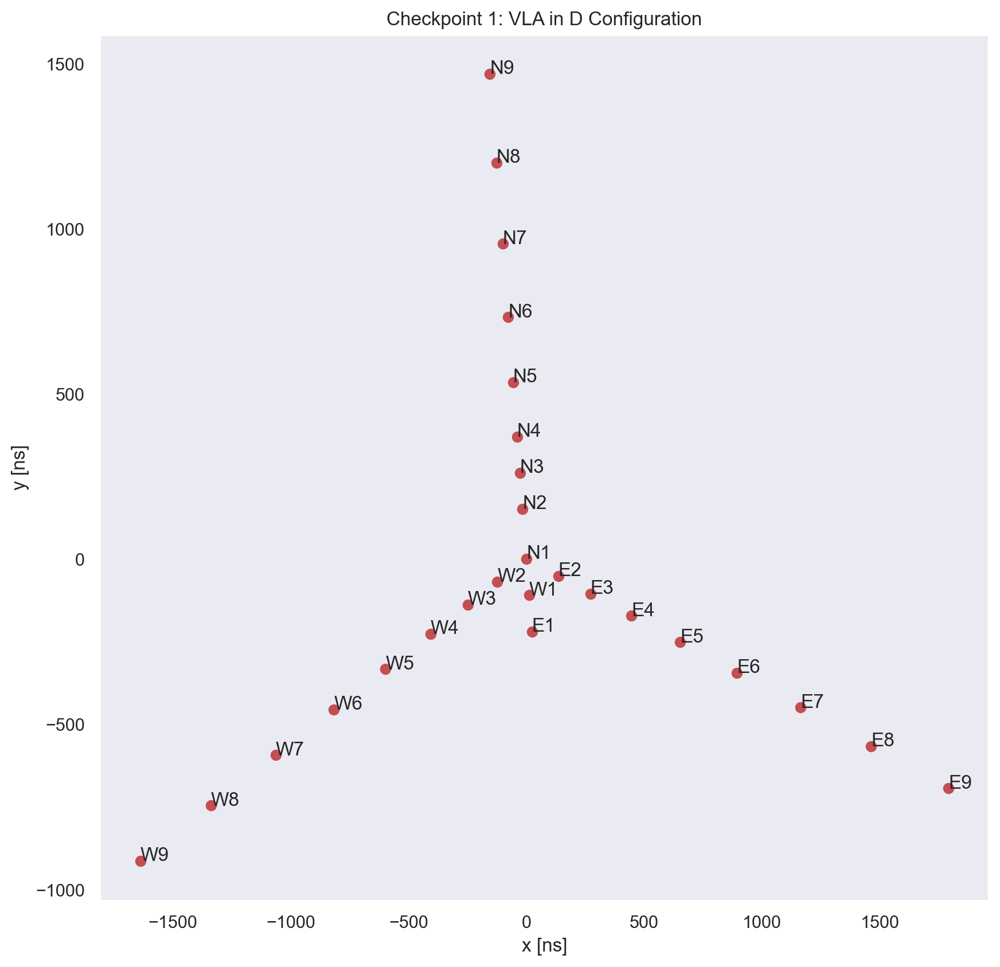

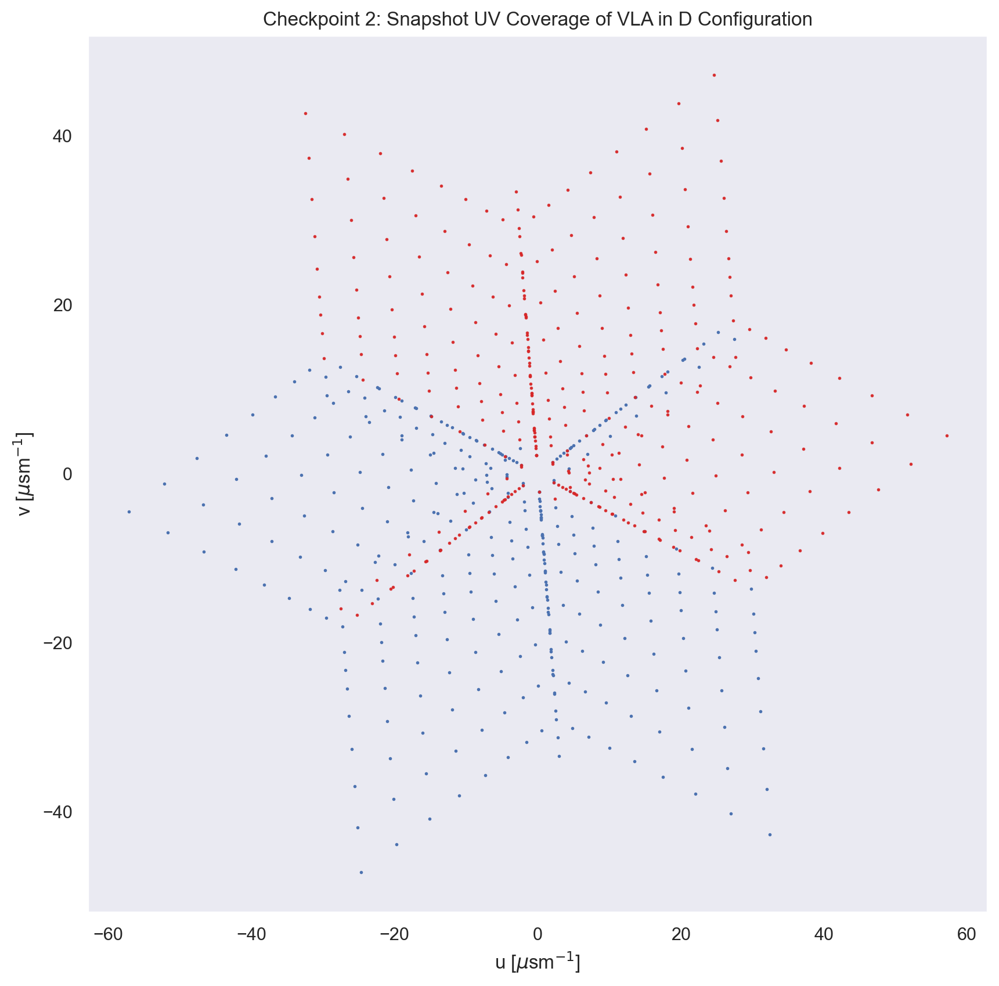

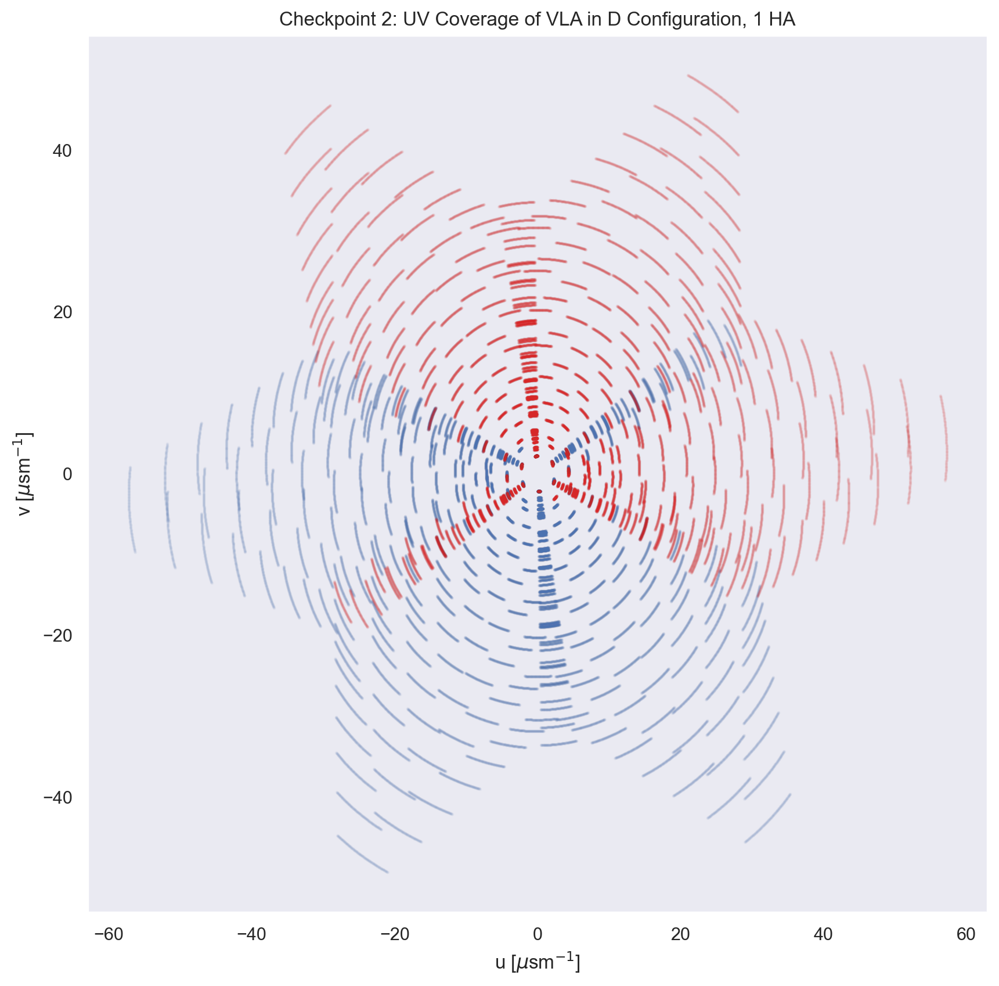

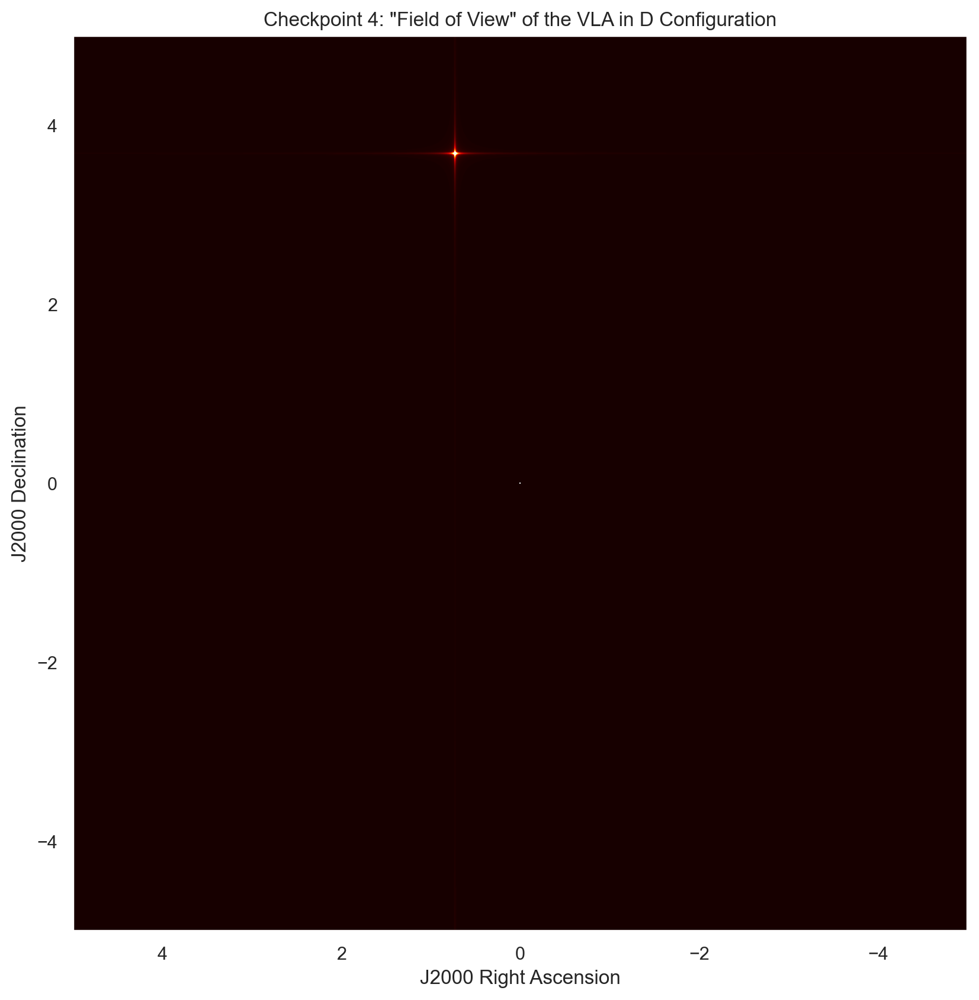

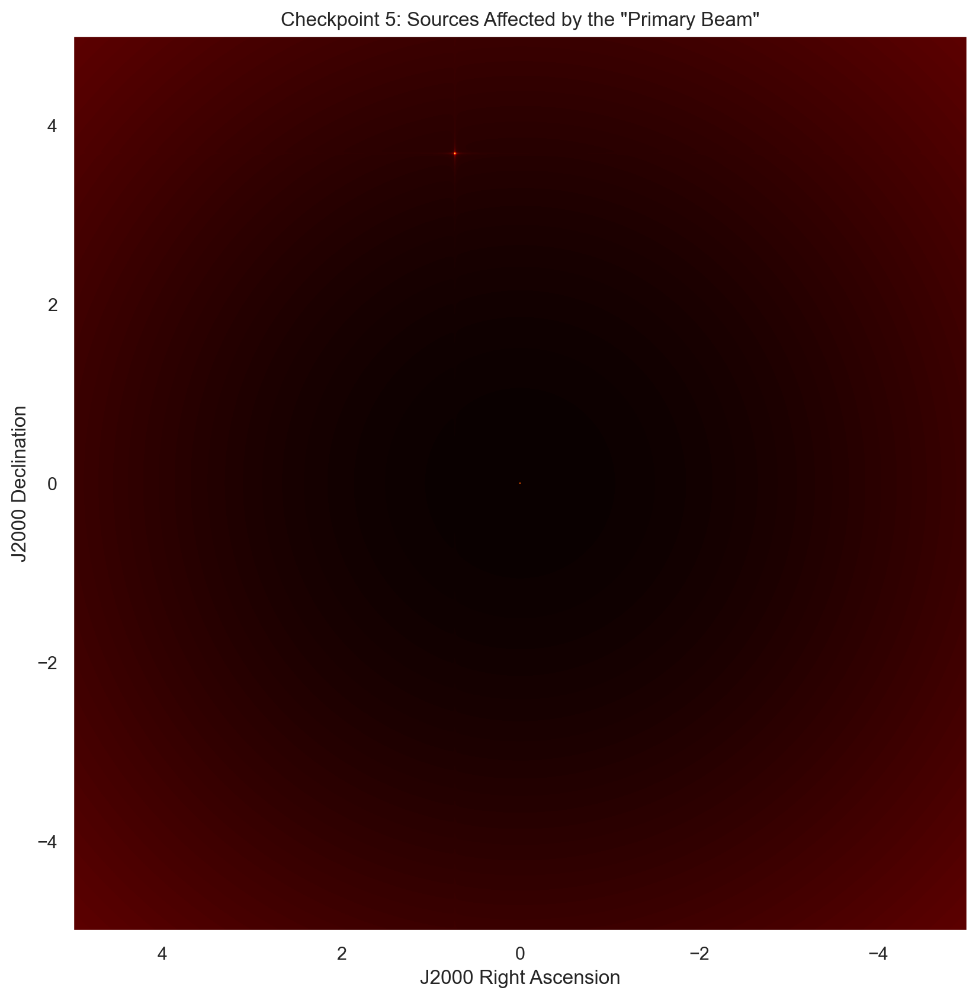

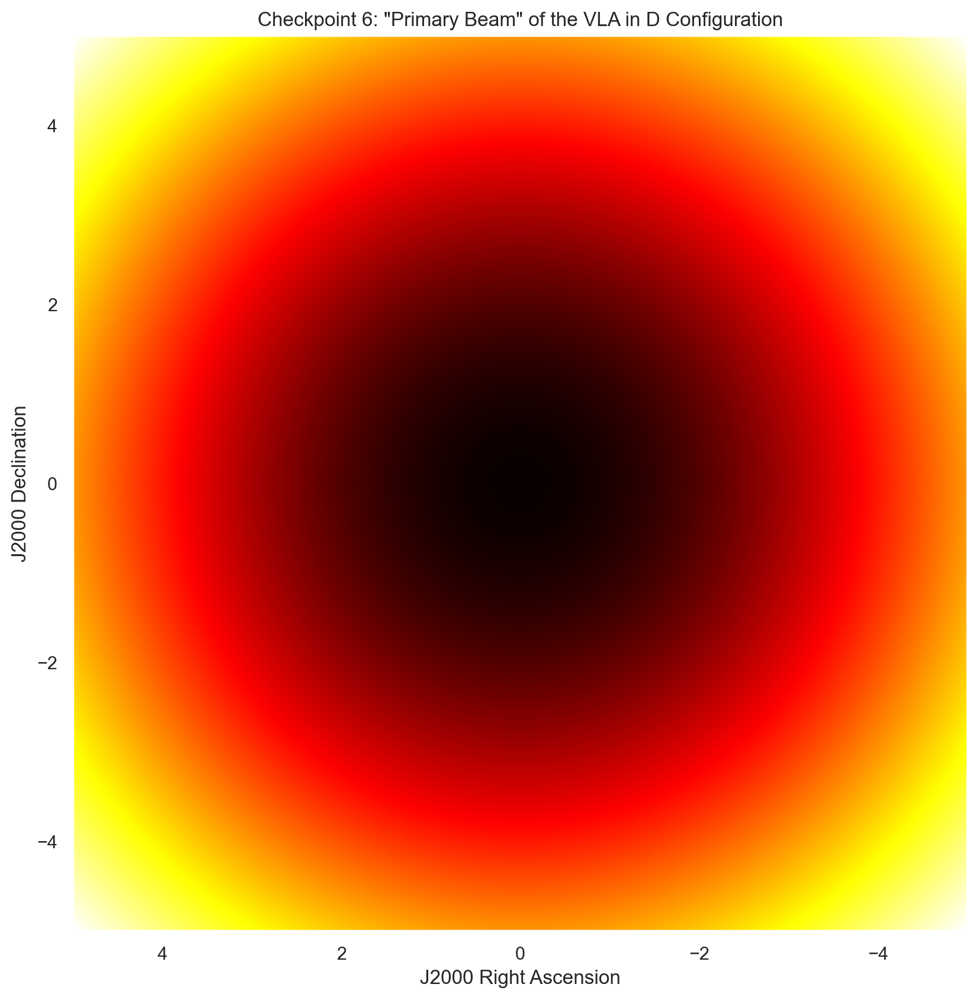

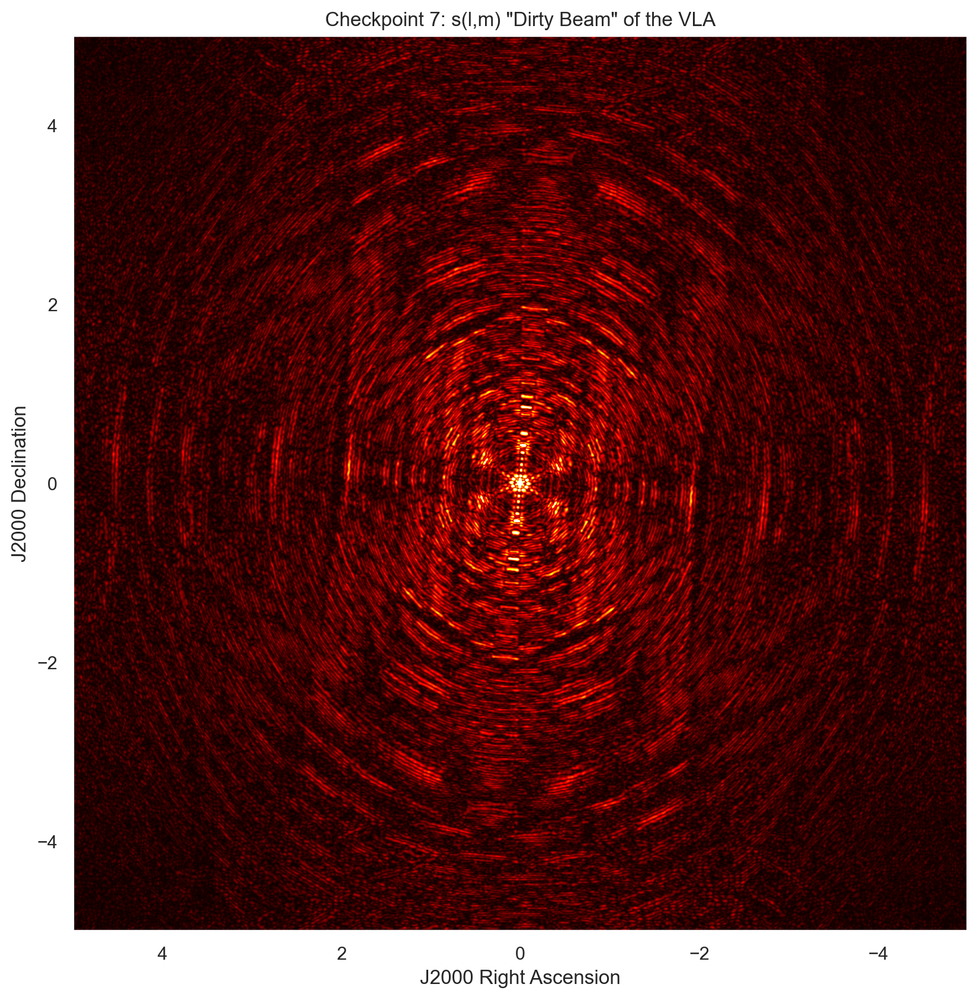

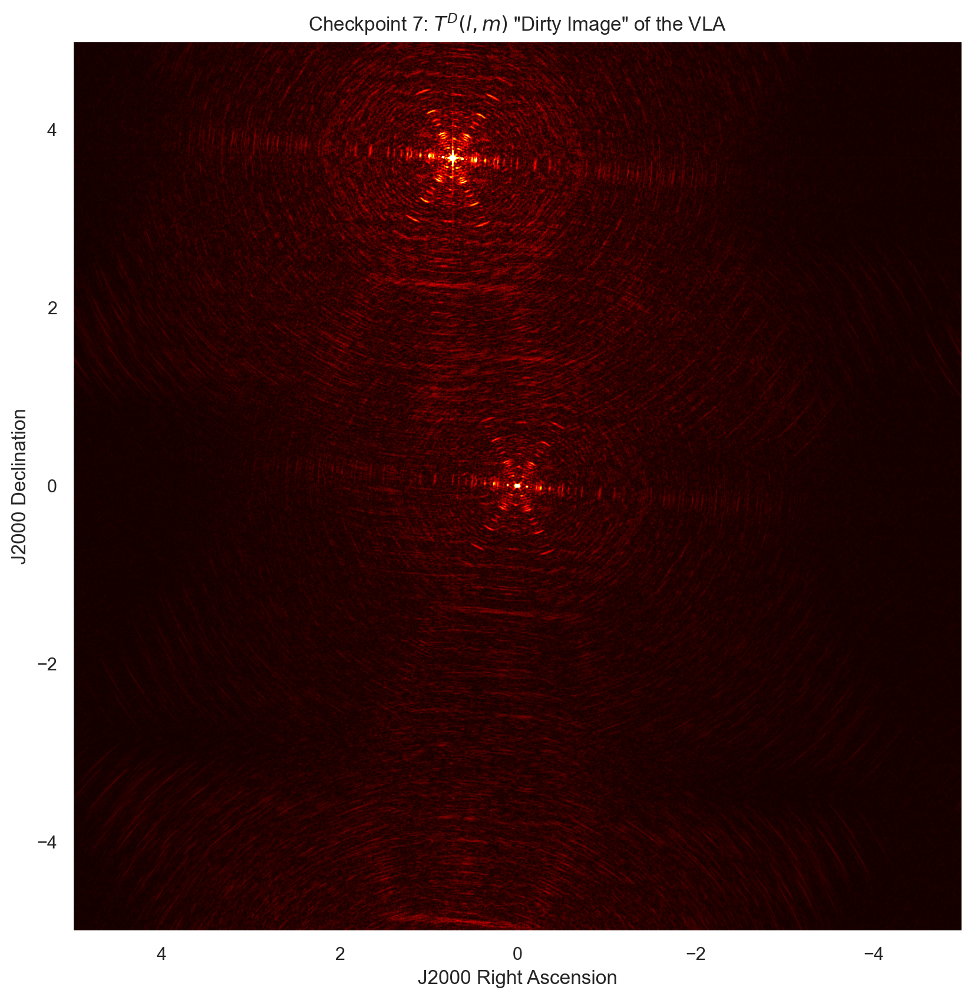

In [318]:
def main(file):
    name, xyz, b_max, XYZ, synth_beam_width, fringe_sep, obs, fringe_period, \
    u, v, image, uv_grid, dirty_beam, dirty_image = import_file_VLA(file)
    #========================================================================#
                                # Checkpoint 1 #
    #========================================================================#
    # Plot the station locations
    fig, ax = plt.subplots(figsize = (10, 10))
    plt.plot(xyz[:,1], xyz[:,2], 'or')
    plt.xlabel('x [ns]')
    plt.ylabel('y [ns]')
    plt.title('Checkpoint 1: VLA in D Configuration')
    for i, txt in enumerate(name):            # Add station names to locations
        plt.annotate(txt, (xyz[:,1][i], xyz[:,2][i]))
    #========================================================================#
                                 # Checkpoint 2 #
    #========================================================================#
    # Snapshot UV-Coverage
    fig, ax = plt.subplots(figsize = (10, 10))
    snapshot = int(steps/2)
    plt.plot(u[:,snapshot]/1e3, v[:,snapshot]/1e3, 'ob', ms = 1)
    plt.plot(-u[:,snapshot]/1e3, -v[:,snapshot]/1e3, 'o', color = 'tab:red', 
                                                        ms = 1, alpha = 0.9)
    plt.title('Checkpoint 2: Snapshot UV Coverage of VLA in D Configuration')
    plt.xlabel('u [$\mu$sm$^{-1}$]')
    plt.ylabel('v [$\mu$sm$^{-1}$]')
    # Plot the UV-Coverage
    fig, ax = plt.subplots(figsize = (10, 10))
    plt.plot(u/1e3, v/1e3, 'o', color = 'b', ms = 1, alpha = 0.05)
    plt.plot(-u/1e3, -v/1e3, 'o', color = 'tab:red', ms = 1, alpha = 0.05)
    plt.title('Checkpoint 2: UV Coverage of VLA in D '+
                                                  'Configuration, %i HA' %HA)
    plt.xlabel('u [$\mu$sm$^{-1}$]')
    plt.ylabel('v [$\mu$sm$^{-1}$]')
    #========================================================================#
                                # Checkpoint 3 #
    #========================================================================#
    print('Checkpoint 3: The Fringe Period is',fringe_period,'seconds.')
    #========================================================================#
                                # Checkpoint 4 #
    #========================================================================#
    # Plot the True Image T(l,m)
    fig, ax = plt.subplots(figsize = (10, 10))
    #plt.axis('off')
    plt.title('Checkpoint 4: \"Field of View\" of the VLA in D Configuration')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    fov = np.abs(np.fft.fftshift(np.fft.ifft2(image)))
    plt.imshow(fov, cmap = 'hot', aspect = 'equal', 
               vmin = -0.01, vmax = 0.5, extent = [5, -5, -5, 5])
    #========================================================================#
                                # Checkpoint 5 #
    #========================================================================#
    # Reduction in peak response due to bandwidth smearing
    fig, ax = plt.subplots(figsize = (10, 10))
    plt.title('Checkpoint 5: Sources Affected by the \"Primary Beam\"')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    primary_beam = gkern(pixels, prim_beam_width, norm = False)
    peak_loss = fov - primary_beam
    plt.imshow(peak_loss, cmap = 'hot', aspect = 'equal', 
                                 extent = [5, -5, -5, 5])
    sig_loss = np.amax(fov) - np.amax(peak_loss)
    print('Checkpoint 5: Origin point source signal is',
          'unnaffected by a reduction in peak response.')
    print('Checkpoint 5: Offset point source reduction in',
          'peak response from the primary beam is:',sig_loss)
    #========================================================================#
                                # Checkpoint 6 #
    #========================================================================#
    # Plot the primary beam.
    fig, ax = plt.subplots(figsize = (10, 10))
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    plt.title('Checkpoint 6: \"Primary Beam\" of the VLA in D Configuration')
    primary_beam = gkern(pixels, std = prim_beam_width, norm = False)
    plt.imshow(-primary_beam, cmap = 'hot', aspect = 'equal', 
                                                      extent = [5, -5, -5, 5])
    print('Checkpoint 6: The Primary Beam-Width is',prim_beam_width,'arcsec.')
    #========================================================================#
                                 # Checkpoint 7 #
    #========================================================================#
    # Plot the Dirty Beam s(l,m)
    fig, ax = plt.subplots(figsize = (10, 10))
    plt.imshow(dirty_beam, cmap = 'hot', vmin = -0.1, vmax = 1000,
                 extent = [5, -5, -5, 5],
              interpolation = 'gaussian')
    plt.title('Checkpoint 7: s(l,m) \"Dirty Beam\" of the VLA')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    print('Checkpoint 7: The Synthesized Beam-Width is',
                             synth_beam_width,'arcsec.')
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Plot the Dirty Image s(l,m)*T(l,m)
    fig, ax = plt.subplots(figsize = (10, 10))
    plt.imshow(dirty_image, cmap = 'hot', vmin = -0.1, vmax = 10,
                 extent = [5, -5, -5, 5],
              interpolation = 'gaussian')
    plt.title('Checkpoint 7: $T^{D}(l,m)$ \"Dirty Image\" of the VLA')
    plt.xlabel("J2000 Right Ascension")
    plt.ylabel("J2000 Declination")
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Hogbom Method
    #I0 = 0
    #I1 = dirty_image - dirty_beam*I0
    #I2 = dirty_image - dirty_beam*I1
    #CLEAN = I2*dirty_beam + (dirty_image - dirty_beam*I2)
    #fig, ax = plt.subplots(figsize = (10, 10))
    #plt.imshow(CLEAN, cmap = 'hot', vmin = 0, vmax = 1000,
    #             extent = [5, -5, -5, 5],
    #          interpolation = 'gaussian')
    #plt.title('Checkpoint 7: Hogbom CLEAN, 2 iter')
    #plt.xlabel("J2000 Right Ascension")
    #plt.ylabel("J2000 Declination")
    #fig.tight_layout()
    #plt.savefig('plots/Checkpoints.png')
    
main('data/vla_d.txt')

### Checkpoint 3 TODO
A diagram to show the real and imaginary components of your “observed” data [[6]](#ref).

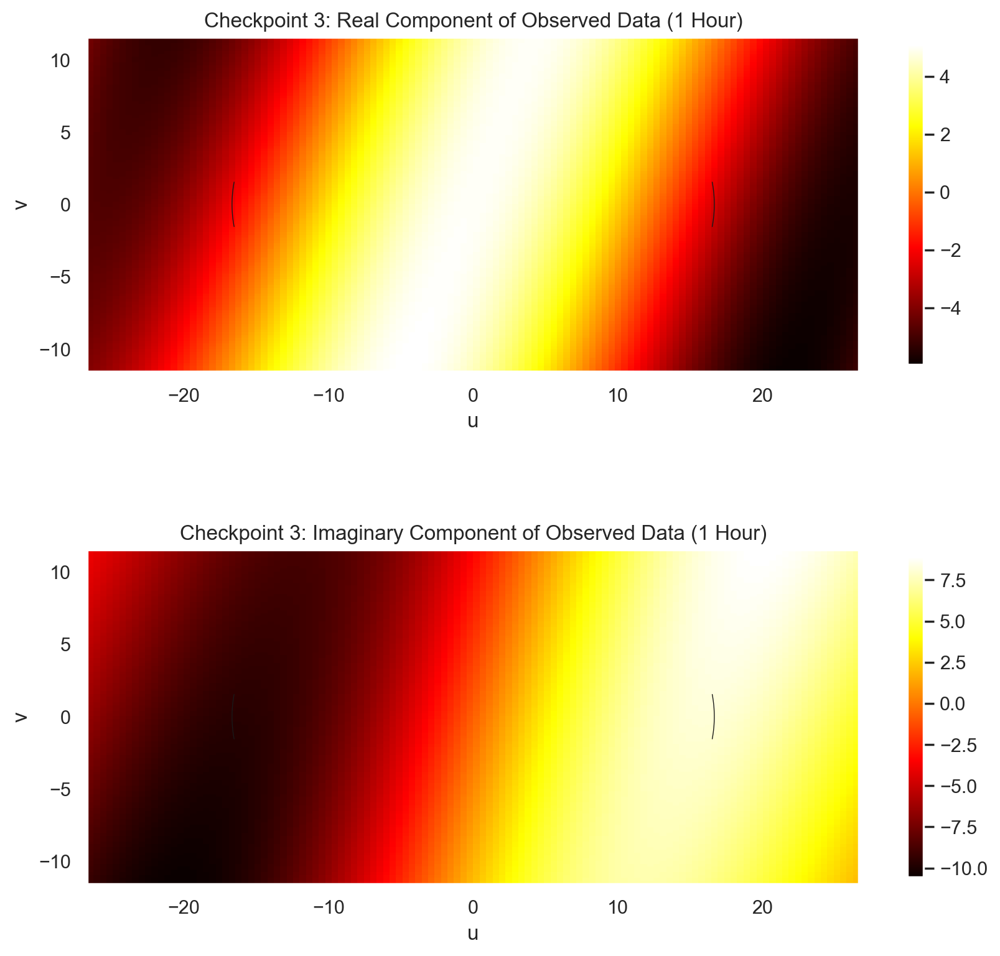

In [307]:
#============================================================================#
                            # Checkpoint 3 #
#============================================================================#
# A diagram to show the real and imaginary components of your “observed” data.
    # Real part
fig, ax = plt.subplots(figsize = (10,10))

plt.subplot(211)
plt.imshow(obs.real, extent = [-1*(np.amax(abs(u_vis))) - 10, 
                                np.amax(abs(u_vis)) + 10, 
                              -1*(np.amax(abs(v_vis))) - 10, 
                                   np.amax(abs(v_vis)) + 10],
                                               cmap = 'hot')
plt.plot(u_vis[:, 0], v_vis[:, 0],"k", lw = 0.5)
plt.plot(-u_vis[:, 1], -v_vis[:, 1],"k", lw = 0.5)
plt.xlabel("u")
plt.ylabel("v")
if HA > 1:
    plt.title("Checkpoint 3: Real Component of Observed Data (%i Hours)" %HA)
else:
    plt.title("Checkpoint 3: Real Component of Observed Data (%i Hour)" %HA)
plt.colorbar(shrink=0.75)
# Imag part
plt.subplot(212)
plt.imshow(obs.imag, extent = [-1*(np.amax(abs(u_vis))) - 10, 
                                np.amax(abs(u_vis)) + 10, 
                              -1*(np.amax(abs(v_vis))) - 10, 
                                   np.amax(abs(v_vis)) + 10],
                                               cmap = 'hot')
plt.plot(u_vis[:, 0], v_vis[:, 0],"k", lw = 0.5)
plt.plot(-u_vis[:, 1], -v_vis[:, 1],"k", lw = 0.5)
plt.xlabel("u")
plt.ylabel("v")
if HA > 1:
    plt.title("Checkpoint 3: Imaginary Component of Observed Data (%i Hours)" %HA)
else:
    plt.title("Checkpoint 3: Imaginary Component of Observed Data (%i Hour)" %HA)
plt.colorbar(shrink=0.75)

# Appendix
***

### A: Test Plots

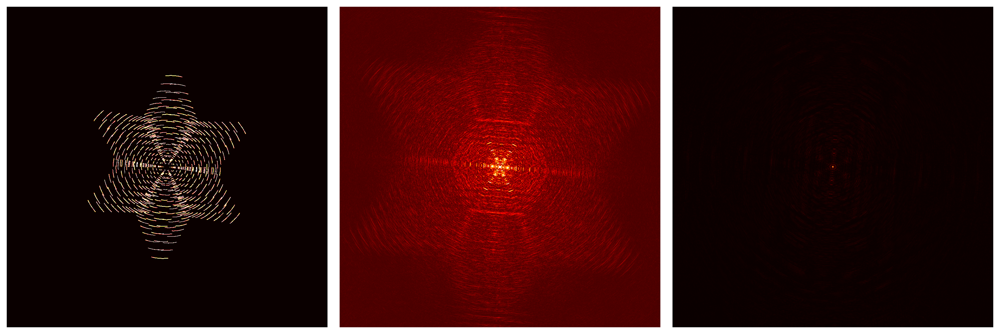

In [298]:
fig, ax = plt.subplots(figsize = (15,15))
plt.subplot(131)
plt.axis('off')
#plt.title('Sample UV Grid S(u,v) Before Convolution')
plt.imshow(np.fft.fftshift(uv_grid), cmap = 'hot', aspect = 'equal', vmin = 0, vmax = 0.5)
    
plt.subplot(132)
plt.axis('off')
#plt.title('Sample UV Grid s(l,m) Before Convolution')
sTa = np.abs(np.fft.fftshift(np.fft.ifft2(dirty_beam)))
plt.imshow(sTa, cmap = 'hot', aspect = 'equal', vmin = -0.1, vmax = 1)

plt.subplot(133)
plt.axis('off')
#plt.title('Sample UV Grid s(l,m)*T(l,m) After Convolution')
sTa = np.abs(np.fft.fftshift(np.fft.ifft2(uv_grid)))
plt.imshow(sTa, cmap = 'hot', aspect = 'equal')
fig.tight_layout()

In [ ]:
fig, ax = plt.subplots(figsize = (15,15))
plt.axis('off')
plt.imshow(image.imag, cmap = 'hot', aspect = 'equal', extent = [-1,1,-1,1])
fig, ax = plt.subplots(figsize = (15,15))
plt.axis('off')
plt.imshow(image.real, cmap = 'hot', aspect = 'equal')

### B: Comparison with SKA

The Synthesized Beam-Width is 14.22919636218073 arcsec.
The Synthesized Beam-Width is 0.3660676730362001 arcsec.


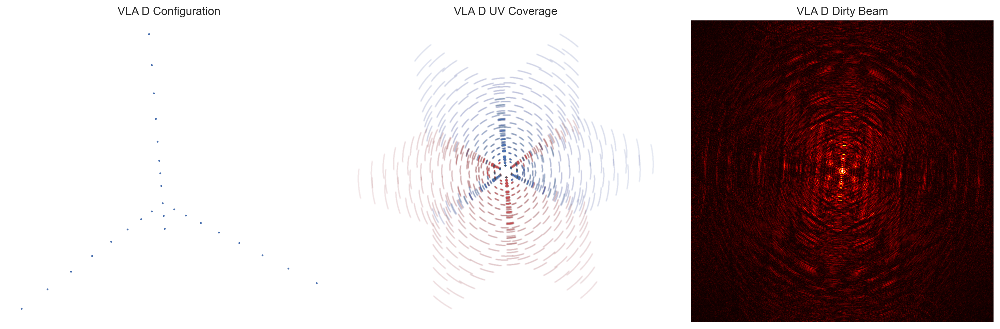

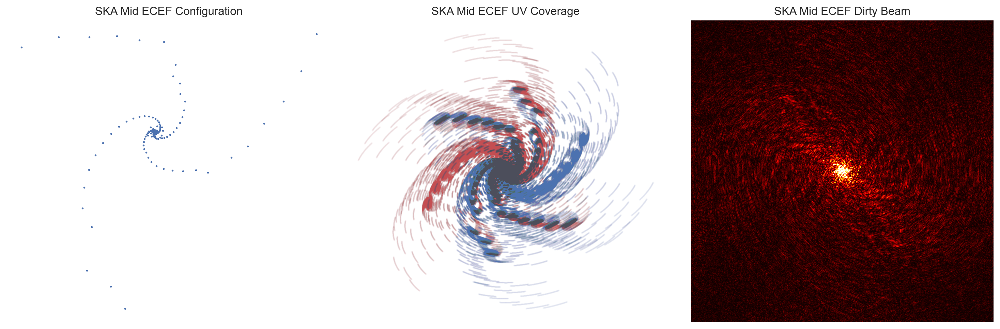

In [311]:
#============================================================================#
                # Extra Testing with SKA data
#============================================================================#

def import_file_SKA(file):
    xyz = np.loadtxt(file, dtype = float, usecols = (0,1,2), delimiter = ',')
    b = int(0.5*len(xyz)*(len(xyz)-1))
    XYZ = []
    for i, xyz_1 in enumerate(xyz):
        for j, xyz_2 in enumerate(xyz):
            if i < j:
                XYZ.append(xyz_1 - xyz_2)
    XYZ = np.array(XYZ)
    b_max = np.amax(XYZ[:,0:1]) - np.abs(np.amin(XYZ[:,0:1]))
    synth_beam_width = ((180*3600)/np.pi)*(taper_factor*lam/b_max)
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Transform to UV coordinates: V(u,v), cycle across hour angle
    X, Y, Z = XYZ[:,0], XYZ[:,1], XYZ[:,2]
    u, v, w = np.zeros((b, steps)), np.zeros((b, steps)), np.zeros((b, steps))
    for i in range(b):
        u[i, :] = lam**(-1)*(np.sin(H)*X[i] + np.cos(H)*Y[i])
        v[i, :] = lam**(-1)*(-np.sin(DEC)*np.cos(H)*X[i] + 
                              np.sin(DEC)*np.sin(H)*Y[i] + 
                                            np.cos(DEC)*Z[i])
    #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~#
    # Create the sample grid: S(u,v), Creates Dirty Beam when fft = s(l,m)
    uv_grid = np.random.normal(0, noise, (pixels, pixels))            
    for i in range(steps):
        uv_grid[(v[:,i]/1e4).astype(np.int), (u[:,i]/1e4).astype(np.int)] = 1
        uv_grid[(-v[:,i]/1e4).astype(np.int), (-u[:,i]/1e4).astype(np.int)] = 1
    dirty_beam = np.abs(np.fft.fftshift(np.fft.fft2(uv_grid)))
    dirty_beam = np.rot90(dirty_beam,3)                    # Dirty Beam s(l,m)
    return xyz, u, v, synth_beam_width, dirty_beam

def multi_plot(file, title):
    if title == 'VLA D':
        name, xyz, b_max, XYZ, synth_beam_width, fringe_sep, fringe_period, \
    obs, u, v, image, uv_grid, dirty_beam, dirty_image = import_file_VLA(file)
    else:
        xyz, u, v, synth_beam_width, dirty_beam = import_file_SKA(file)
    fig, ax = plt.subplots(figsize = (15,5))
    # Plot Layout
    plt.subplot(131)
    plt.plot(xyz[:,1], xyz[:,2], 'o', ms = 1)
    plt.xlabel('x [ns]')
    plt.ylabel('y [ns]')
    plt.axis('off')
    plt.title(title+' Configuration')
    # Plot the UV-Coverage
    plt.subplot(132)
    plt.title(title+' UV Coverage')
    plt.plot(u/1e3, v/1e3, 'or', ms = 1, alpha = 0.01)
    plt.plot(-u/1e3, -v/1e3, 'ob', ms = 1, alpha = 0.01) # Conjugates
    plt.axis('off')
    # Plot Dirty Beam
    plt.subplot(133)
    plt.title(title+' Dirty Beam')
    plt.axis('off')
    plt.imshow(dirty_beam, cmap = 'hot', vmin = -0.1, vmax = 1500,
              interpolation = 'gaussian')
    print('The Synthesized Beam-Width is',synth_beam_width,'arcsec.')
    fig.tight_layout()

DEC = np.radians(45)
multi_plot('data/vla_d.txt', 'VLA D')
DEC = np.radians(-30)
multi_plot('data/SKA1_mid_ecef.txt', 'SKA Mid ECEF')

<a id='ref'></a>
# References
***

[1] VLA Data obtained from:
https://science.nrao.edu/facilities/vla/docs/manuals/oss2016A/ant_positions.pdf
Accessed: 03/11/2020

[2] Casa documentation for reference images:
https://casa.nrao.edu/casadocs/casa-5.4.0/usingcasa/python-basics-for-casa
Accessed: 04/11/2020

[3] Equations behind Interferometry:
https://www.cv.nrao.edu/course/astr534/Interferometers2.html
Accessed: 07/11/2020

[4] Equations behind Interferometry:
https://www.icrar.org/wp-content/uploads/2018/11/Perley_Basic_Radio_Interferometry_Geometry.pdf
Accessed: 07/11/2020

[5] Documentation concerning primary beam:
http://library.nrao.edu/public/memos/evla/EVLAM_195.pdf
Accessed: 07/11/2020

[6] Radio Interferometry Guide:
http://math_research.uct.ac.za/~siphelo/admin/interferometry/
Accessed: 09/11/2020

[7] Reference plots to compare against:
https://casaguides.nrao.edu/index.php?title=Protoplanetary_Disk_Simulation_-_VLA-CASA5.7.0
Accessed: 11/11/2020

[8] Gaussian code:
https://gist.github.com/thomasaarholt/267ec4fff40ca9dff1106490ea3b7567
Accessed: 11/11/2020

[9] Imaging and Deconvolution:
https://science.nrao.edu/science/meetings/2014/14th-synthesis-imaging-workshop/lectures-files/wilner_siw2014.pdf
Accessed: 12/11/2020

In [312]:
%%capture
os.system('jupyter nbconvert --to html Radio_Interferometer.ipynb')